
## This notebook needs some minor reworking before running on DataProc (please do NOT load on DataProc as is)

**Created by Dr James G. Shanahan, 4/2023**


This notebook can NOT be run on DataProc.  The following are the key issues that need addressing:

* embedding images need to be saved to the GitHub public repo
* the data needs to be storeed on a Google Cloud bucket so Spark can access it



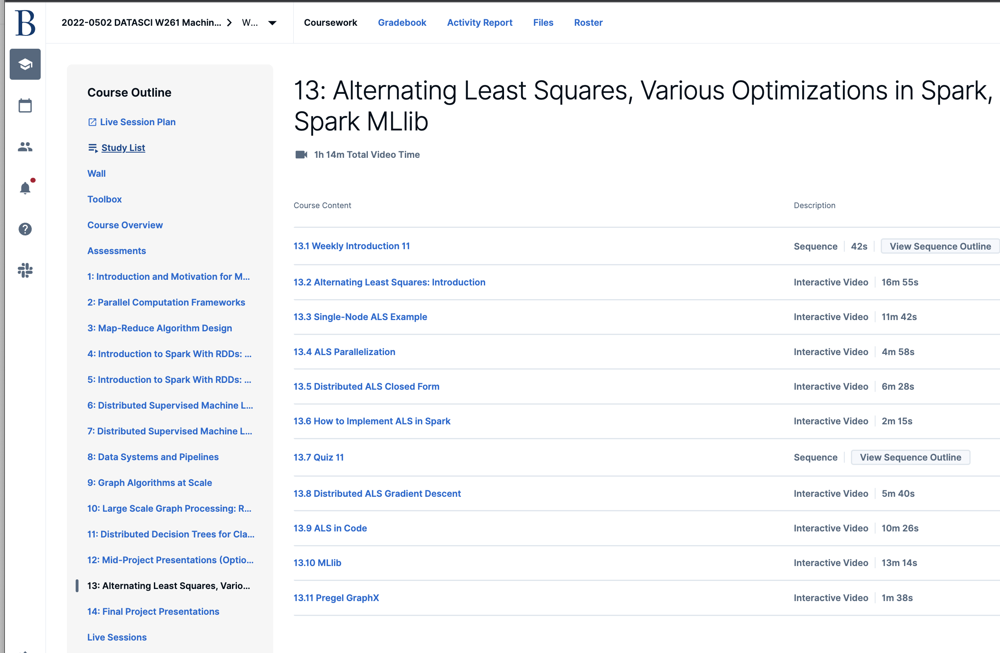

# wk11 Demo - Recommender Systems; from item-to-item to ALS to deep learning
__`MIDS w261: Machine Learning at Scale | UC Berkeley School of Information |Spring 2023]`__

Last week we did pagerank. This week we're doing Alternating Least Squares (ALS) Regression. 

In class today we'll start with a general discussion of recommender systems, then we'll look at some basic theory of ALS and how it can be prallelized in a map/reduce framework like Spark. 

We provide the code for a closed-form ridge regression (l2) starting with a single node implementation, distributed implementation, and a mllib implementation, for your reference.


By the end of today's demo you should be able to:  
* ... __identify__ pros and cons in various RS approaches
* ... __describe__ ALS regression 
* ... __implement__ ALS regression in a distributed fashion.


Recommender systems reveiw in R:
* https://arxiv.org/pdf/2205.12371.pdfhttps://arxiv.org/pdf/2205.12371.pdf

Recommender systems reveiw in R:
* https://arxiv.org/pdf/2205.12371.pdfhttps://arxiv.org/pdf/2205.12371.pdf

__`Additional Resources:`__ 
- The code in this notebook was based on several notebooks by Jimi Shanahan   
- Recommendation Systems: Techniques, Challenges, Application, and Evaluation https://www.researchgate.net/publication/328640457_Recommendation_Systems_Techniques_Challenges_Application_and_Evaluation_SocProS_2017_Volume_2
- Matrix Completion via Alternating Least Square(ALS) https://web.stanford.edu/~rezab/classes/cme323/S15/notes/lec14.pdf    
- Matrix Completion and Low-Rank SVD via Fast Alternating Least Squares https://arxiv.org/pdf/1410.2596.pdf     
- Explicit Matrix Factorization: ALS, SGD, and All That Jazz https://blog.insightdatascience.com/explicit-matrix-factorization-als-sgd-and-all-that-jazz-b00e4d9b21ea    
- Collaborative Filtering for Implicit Feedback Datasets http://yifanhu.net/PUB/cf.pdf    
- Joeran Beel https://www.tcd.ie/research/researchmatters/joeran-beel.php
- Target case study https://www.linkedin.com/pulse/20140616204813-2554671-lessons-from-target-s-pregnancy-prediction-pr-fiasco/

- Collaborative Filtering - RDD-based API https://spark.apache.org/docs/latest/mllib-collaborative-filtering.html

# Background discussion

## Recommender systems (RS) as personalization engines based upon user behavior (actions-based or content or hybrid)

According to [WikiPedia](https://en.wikipedia.org/wiki/Recommender_system), a recommender system, or a recommendation system (sometimes replacing 'system' with a synonym such as platform or engine), is a subclass of information filtering system that provide suggestions for items that are most pertinent to a particular user. Typically, the suggestions refer to various decision-making processes, such as what product to purchase, what music to listen to, or what online news to read. Recommender systems are particularly useful when an individual needs to choose an item from a potentially overwhelming number of items that a service may offer.According to [WikiPedia](https://en.wikipedia.org/wiki/Recommender_system), a recommender system, or a recommendation system (sometimes replacing 'system' with a synonym such as platform or engine), is a subclass of information filtering system that provide suggestions for items that are most pertinent to a particular user. Typically, the suggestions refer to various decision-making processes, such as what product to purchase, what music to listen to, or what online news to read. Recommender systems are particularly useful when an individual needs to choose an item from a potentially overwhelming number of items that a service may offer.


>From a research perspective, recommender-systems are one of the most diverse areas imaginable. The areas of interest range from hard mathematical/algorithmic problems over user-centric problems (user interfaces, evaluations, privacy) to ethical and political questions (bias, information bubbles). Given this broad range, many disciplines contribute to recommender-systems research including computer science (e.g. information retrieval, natural language processing, graphic and user interface design, machine learning, distributed computing, high performance computing) the social sciences, and many more. Recommender-systems research can also be conducted in almost every domain including e-commerce, movies, music, art, health, food, legal, or finance. This opens the door for interdisciplinary cooperation with exciting challenges and high potential for impactful work. ~Joeran Beel    
*Dr Joeran Beel is an Ussher Assistant Professor in the Artificial Intelligence Discipline at the School of Computer Science & Statistics at Trinity College Dublin. https://www.tcd.ie/research/researchmatters/joeran-beel.php*

Most of us are inundated with examples of recommendation systems, from Facebook, to Amazon, to Netflix. So instead of  starting with ‘what they are’,   maybe it’s good to start with a quick discussion about what unspoken assumptions underlie their ubiquity. 

### Discussion questions:
* What are some of the political and ethical questions related to RS? What could go wrong? Examples?
* What are some assumptions to keep in mind and/or try to avoid when designing RS?
* What is the value proposition? who are the stakeholders?
* What are some of the areas of expertise involved in designing RS?

### <--- SOLUTION --->

Issues   
* privacy (Target example)
* biases
* information bubbles

Value Proposition Assumption
* “Help people” navigate information complexity?
* Drive usage?
* Harness cognitive biases?

Feasibility Assumption
* Something in the data we have allows us to know something about your future choices.

Believer: recommendations save the user time    
Skeptic: why does the system know better than the user what they want?

While we're not going to delve into how to address some of these ethical and philosophical questions, it's important to keep these things in mind when thinking about designing your system.

# Types of Recommender Systems

# Recommender systems
According to [WikiPedia](https://en.wikipedia.org/wiki/Recommender_system), a recommender system, or a recommendation system (sometimes replacing 'system' with a synonym such as platform or engine), is a subclass of information filtering system that provide suggestions for items that are most pertinent to a particular user. Typically, the suggestions refer to various decision-making processes, such as what product to purchase, what music to listen to, or what online news to read. Recommender systems are particularly useful when an individual needs to choose an item from a potentially overwhelming number of items that a service may offer.
## Apps
Recommender systems are used in a variety of areas, with commonly recognised examples taking the form of playlist generators for video and music services, product recommenders for online stores, or content recommenders for social media platforms and open web content recommenders. These systems can operate using a single input, like music, or multiple inputs within and across platforms like news, books and search queries. There are also popular recommender systems for specific topics like restaurants and online dating. Recommender systems have also been developed to explore research articles and experts, collaborators, and financial services.


Please refer to the following paper for more background:

https://www.researchgate.net/publication/328640457_Recommendation_Systems_Techniques_Challenges_Application_and_Evaluation_SocProS_2017_Volume_2

The following provides breakdown of the key families of recommender systems:

<img src="https://raw.githubusercontent.com/UCB-w261/w261-environment/master/notebook-images/week13/types-diagram.png" width="70%">


<img src="https://raw.githubusercontent.com/UCB-w261/w261-environment/master/notebook-images/week13/RS-comparison-table.png" width="100%">


## Neighborhood-based collaborative filtering (aka non-parametric or memory-based CF)

Neighborhood-based collaborative filtering is a non-parametric or memory-based approach to CF. It relies on similarity measures to define neighbors of users or items depending on which Neighborhood-based approach is taken. 

* Item-to-item based CF has many attractive properties including scale, and being more robust in the presence of new ratings data. 

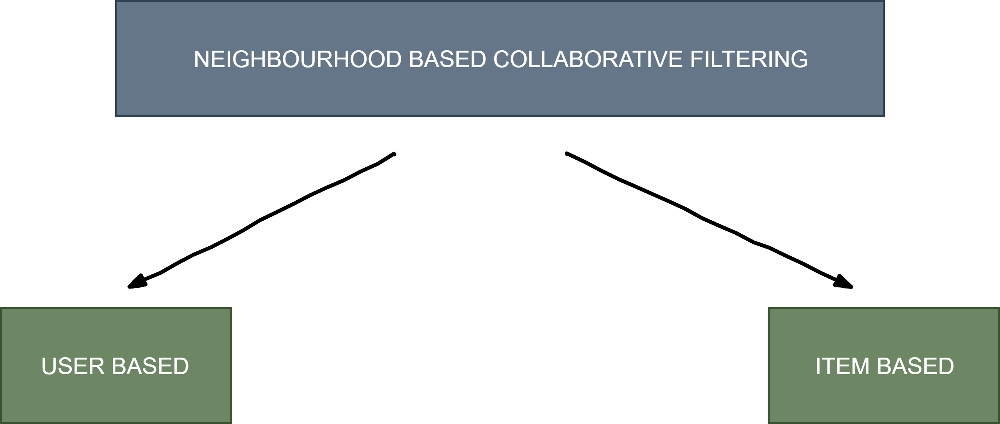

##  Similarity measures for Neighborhood-based collaborative filtering (aka non-parametric or memory-based CF)

Collaborative filters try to leverage the power of the
community  to give reliable, relevant, and sometimes, even surprising recommendations. If
Alice and Carol largely like the same movies (say Pirates of the Caribbean	Titanic		Transformers)
and Alice also likes Avatar, it is extremely likely that Carol, who hasn't watched
Avatar, will like it too.

Above we built some basic collaborative filterings pipelines, and in the next phase of the project, we will build more sophisticade recomendation engines. However, before we
do that, it is important that we have a good grasp of the underlying techniques, principles,
and algorithms that go into building recomendation engines.

### Similarity measures

Given two items, how do we mathematically quantify how
different or similar they are to each other? Similarity measures help us in
answering this question.


From the rating matrix in the previous section, we see that every user can be represented as
a j-dimensional vector where the kth dimension denotes the rating given by that user to the
kth item. Let's use a 1 to 5 star rating,  a one-star represents  a dislike, and five-star represents a like, and ratings between 1-5 denote a graded liking.
Therefore, user Bob can be represented as rating vector (np.nan, 3, 4, 4, 1). Similarly, every item can also be
represented as an i-dimensional vector where the kth dimension denotes the rating given to
that item by the kth user. The Harry Potter item is therefore represented as (np.nan, np.nan 4, 4, 5).

In [3]:
# Partial ratings
partial_ratings_df = pd.DataFrame(
    [[np.nan ,3,5,4, 1],
     [np.nan, 3, 4, 4, 1],
     [4,3, np.nan, 3, 1],
     [4,4,4, 3, 1],
     [5,4, 5, np.nan, 3] ],
    columns = ["Harry Potter", "Pirates of the Caribbean", "Titanic", "Avatar","Transformers"],
    index = ["Alice", "Bob", "Carol", "Dave", "Eve"] )
print("Missing ratings")
display(partial_ratings_df) 


Missing ratings


,Harry Potter,Pirates of the Caribbean,Titanic,Avatar,Transformers
Alice,NaN,3,5.0,4.0,1
Bob,NaN,3,4.0,4.0,1
Carol,4.0,3,NaN,3.0,1
Dave,4.0,4,4.0,3.0,1
Eve,5.0,4,5.0,NaN,3


#### Euclidean distance (length of the line segment joining the two data points)
The Euclidean distance can be defined as the length of the line segment joining the two data
points plotted on an n-dimensional Cartesian plane. For example, consider two points
plotted in a 2D plane:

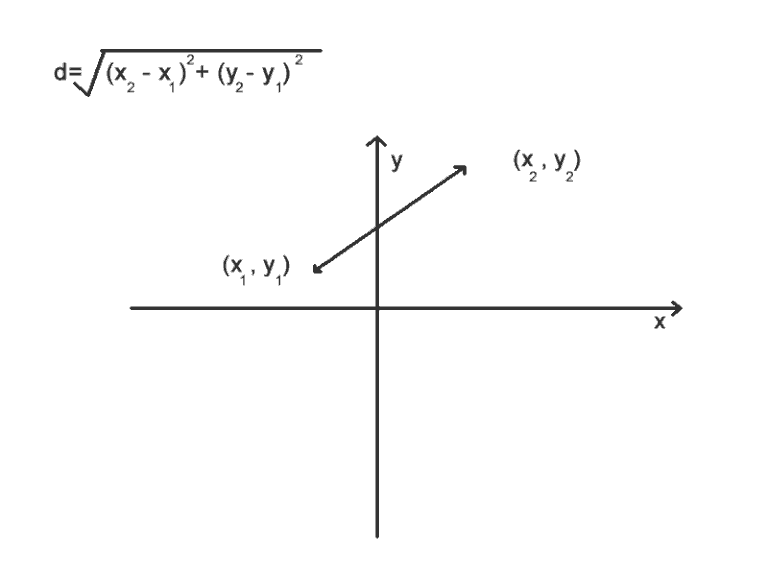

The distance, $d$, between the two points gives us the Euclidean distance and its formula in
the 2D-space is given in the preceding graph.

The Euclidean distance between points p and q is the length of the line segment connecting them (${\displaystyle {\overline {\mathbf {p} \mathbf {q} }}}$).

In Cartesian coordinates, if $p = (p1, p2,..., pn)$ and $q = (q1, q2,..., qn)$ are two points in Euclidean n-space, then the distance ($d$) from $p$ to $q$, or from $q$ to $p$ is given by the Pythagorean formula:

$${\displaystyle {\begin{aligned}d(\mathbf {p} ,\mathbf {q} )=d(\mathbf {q} ,\mathbf {p} )&={\sqrt {(q_{1}-p_{1})^{2}+(q_{2}-p_{2})^{2}+\cdots +(q_{n}-p_{n})^{2}}}\\[8pt]&={\sqrt {\sum _{i=1}^{n}(q_{i}-p_{i})^{2}}}.\end{aligned}}}$$

In [64]:
import numpy as np
print(f"Euclidean distance between [1,1])and [3,3] is : {np.sqrt(sum(np.power(np.array([1,1]) - np.array([3,3]), 2)))}")



Euclidean distance between [1,1])and [3,3] is : 2.8284271247461903


In [61]:
# Easier way is to use np.linalg.norm to calculate the length of the difference vector
print(f"Euclidean distance between [1,1])and [3,3] is : {np.linalg.norm([1,1] - np.array([3,3]), ord=2)}")

np.linalg.norm([1,1] - np.arange(0,2)): 2.8284271247461903


Euclidean scores can take any value between 0 and infinity. The lower the Euclidean score
(or distance), the more similar the two vectors are to each other.

In [69]:
#Define 3 users with ratings for 5 movies
u1 = np.array([5,1,2,4,5])
u2 = np.array([1,5,4,2,1])
u3 = np.array([5,2,2,4,4])

print(f"Euclidean distance between u1:{u1}and u2:{u2} is : {np.linalg.norm((u1 - u2), ord=2)}")
print(f"Euclidean distance between u1:{u1}and u3:{u3} is : {np.linalg.norm((u1 - u3), ord=2)}")

Euclidean distance between u1:[5 1 2 4 5]and u2:[1 5 4 2 1] is : 7.483314773547883
Euclidean distance between u1:[5 1 2 4 5]and u3:[5 2 2 4 4] is : 1.4142135623730951


From the ratings, we can see that users 1 and 2 have extremely different tastes, whereas the
tastes of users 1 and 3 are largely similar

#### Similarity of movies  based on cosine similarity 

Cosine-based Similarity is a great way to measure the similarity between two vectors of numbers.
Cosine-based Similarity sometimes known as vector-based similarity in an inner product space, and the cosine similarity is defined as the cosine of the angle between them, that is, the dot product of the vectors divided by the product of their lengths. It follows that the cosine similarity does not depend on the magnitudes of the vectors, but only on their angle. 

 The cosine similarity between two vectors can be calculated as followings:

$${\displaystyle {\text{similarity}}=\cos(\theta )={\mathbf {A} \cdot \mathbf {B} \over \|\mathbf {A} \|\|\mathbf {B} \|}={\frac {\sum \limits _{i=1}^{n}{A_{i}B_{i}}}{{\sqrt {\sum \limits _{i=1}^{n}{A_{i}^{2}}}}{\sqrt {\sum \limits _{i=1}^{n}{B_{i}^{2}}}}}},}$$


The cosine similarity always belongs to the interval $[-1,1]$. 
* For example, two proportional vectors have a cosine similarity of 1
* two orthogonal vectors have a similarity of 0, 
* and two opposite vectors have a similarity of -1. 


Assuming $A =  [3, 4] $ and $B = [1, 1]$ then the $\cos(\mathbf {A}, \mathbf {B})$ is $0.989$.

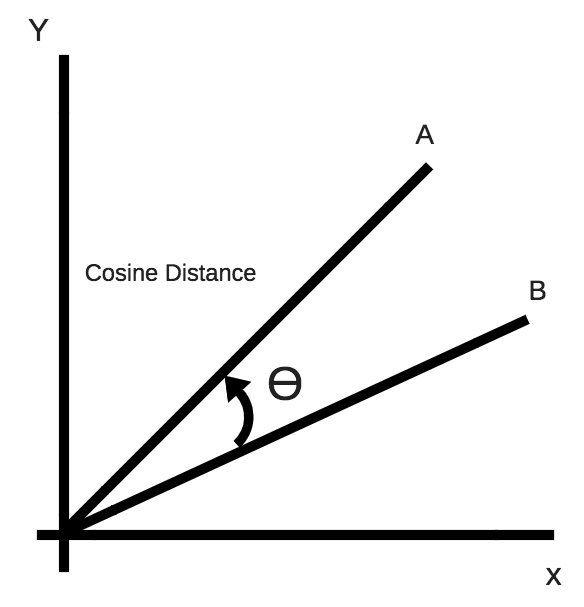

The cosine similarity score computes the cosine of the angle between two vectors in an n-dimensional
space. When the cosine score is 1 (or angle is 0), the vectors are exactly similar.
On the other hand, a cosine score of -1 (or angle 180 degrees) denotes that the two vectors
are exactly dissimilar to each other.

##### Homegrown Cosine 

In [72]:
import math
def cosine_similarity_1(v1,v2):
    "compute cosine similarity of v1 to v2: (v1 dot v2)/{||v1||*||v2||)"
    sumxx, sumxy, sumyy = 0, 0, 0
    for i in range(len(v1)):
        x = v1[i]; y = v2[i]
        sumxx += x*x
        sumyy += y*y
        sumxy += x*y
    return sumxy/math.sqrt(sumxx*sumyy)

def cosine_similarity(v1,v2):
    "compute cosine similarity of v1 to v2: (v1 dot v2)/{||v1||*||v2||)"
    sumxx, sumxy, sumyy = 0, 0, 0
    for i in range(len(v1)):
        x = v1[i]; y = v2[i]
        sumxx += x*x
        sumyy += y*y
        sumxy += x*y
    return sumxy/(math.sqrt(sumxx)*math.sqrt(sumyy))

v1,v2 = [3, 4], [1, 1]
print(v1, v2, cosine_similarity_1(v1,v2))
v1,v2 = [3, 4], [1, 1]
print(v1, v2, cosine_similarity(v1,v2))

v1,v2 = [3, 45, 7, 2], [2, 54, 13, 15]
print(v1, v2, cosine_similarity(v1,v2))

#Output: [3, 45, 7, 2] [2, 54, 13, 15] 0.972284251712

[3, 4] [1, 1] 0.9899494936611665
[3, 4] [1, 1] 0.9899494936611665
[3, 45, 7, 2] [2, 54, 13, 15] 0.9722842517123499


#####  Cosine using numpy and lamdda functions

In [73]:
# Cosine using numpy and lamdda functions
cosine_sim = lambda v1, v2: np.dot(v1,v2)/(np.sqrt(np.dot(v1,v1)) * np.sqrt(np.dot(v2,v2)))
cosine_sim(v1, v2)

0.9722842517123499

##### Task:  Calculate the cosine similarity between the given two vectors a and b. Report your result to 3 decimal places.



#### Pearson(Correlation)-based Similarity
Euclidean distances place emphasis on magnitude, and in the process, are not able to gauge
the degree of similarity or dissimilarity well. This is where the Pearson correlation comes
into the picture. The Pearson correlation is a score between -1 and 1, where -1 indicates total
negative correlation  and 1 indicates total positive
correlation , whereas 0 indicates that the two entities are
in no way correlated with each other (or are independent of each other).
Mathematically, the Pearson correlation is defined as follows:

\begin{equation}\label{eq:pearson}
Pearson\_sim(i,j) = \dfrac{\sum\limits_{u\in U}(R_{u,i} - \overline{R_i})(R_{u,j}-\overline{R_j})}
{\sqrt{\sum\limits_{u \in U} (R_{u,i}- \overline{R_i})^2 \sum\limits_{u\in U} (R_{u,j} - \overline{R_j})^2}}
\end{equation}

This similarity measure is based on how much the ratings by common to users for a pair of items deviate from average ratings for those items,



##### Pearson Correlation via the SciPy package
The SciPy package gives us access to a function that computes the Pearson Similarity
Scores:

In [75]:
alice = np.array([1,1,3,2,4])
bob   = np.array([2,2,4,3,5])
eve   = np.array([5,5,3,4,2])

print(f"Euclidean distance between alice:{alice} and bob:{bob} is : {np.linalg.norm((alice - bob), ord=2)}")
print(f"Euclidean distance between alice:{alice} and eve:{eve} is : {np.linalg.norm((alice - eve), ord=2)}")


Euclidean distance between alice:[1 1 3 2 4]and bob:[2 2 4 3 5] is : 2.23606797749979
Euclidean distance between alice:[1 1 3 2 4]and eve:[5 5 3 4 2] is : 6.324555320336759


In [77]:
from scipy.stats import pearsonr


print(f"pearson correlation between alice:{alice}and bob:{bob} is : {pearsonr(alice, bob)[0]}")
print(f"pearson correlation between alice:{alice}and eve:{eve} is : {pearsonr(alice, eve)[0]}")


pearson correlation between alice:[1 1 3 2 4]and bob:[2 2 4 3 5] is : 1.0
pearson correlation between alice:[1 1 3 2 4]and eve:[5 5 3 4 2] is : -1.0


We see that Alice and Bob have the
highest possible similarity score, whereas Alice and Eve have the lowest possible score. Alice and Bob's rating vectors are in the same rank order.
Can you guess the similarity score for Bob and Eve?

In [79]:
print(f"pearson correlation between alice:{bob}and eve:{eve} is : {pearsonr(bob, eve)[0]}")


pearson correlation between alice:[2 2 4 3 5]and eve:[5 5 3 4 2] is : -1.0


## User-to-user based collaborative filtering

User-User collaborative filtering (UUCF) approach heavily relies on active user neighborhood information to make predictions and recommendations. Neighborhood selection can either make or break the recommendation for an active user and can have a direct bearing on the rating prediction and item recommendation.

For more background, please see [here](https://towardsdatascience.com/user-user-collaborative-filtering-for-jokes-recommendation-b6b1e4ec8642#:~:text=User%2DUser%20collaborative%20filtering%20(UUCF,rating%20prediction%20and%20item%20recommendation.).

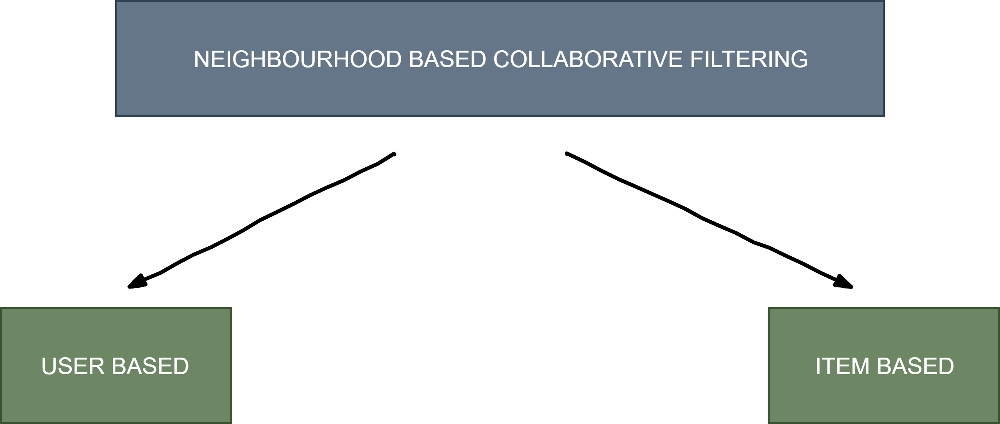

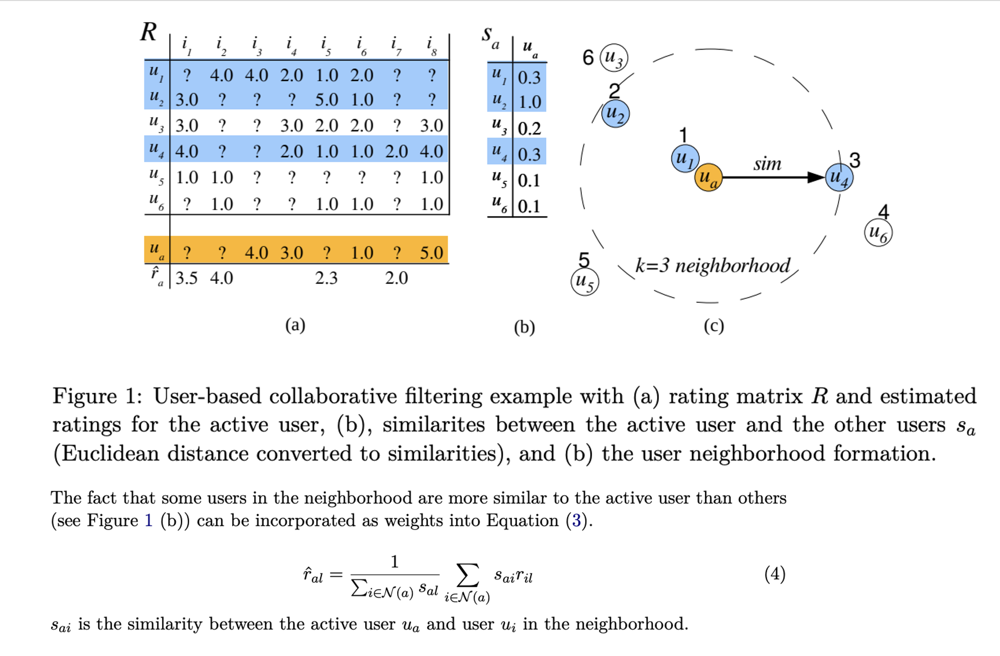

## Item-to-item-based  collaborative filtering (model-based)

* Model is a KNN based sparse matrix and the user ratings vectors
* Convert a ratings matrix $MxN$ to a KNN sparse matrix of MxK that is known as the model

For generating predictions for a user $u$ on item $𝑖$, our algorithm first retrieves the precomputed $𝑘$ most similar items corresponding to the target item $𝑖$. Then it looks how many of those $𝑘$ items were purchased by the user $u$, based on this intersection then the prediction is computed using basic item-based collaborative filtering algorithm.

$$P_{u,i} = \dfrac{\sum_{\text{all similar items, N}}s_{i,N} * R_{u,N}}{\sum_{\text{all similar items, N}}(|s_{i,N}|)}$$


* Item to Item Similarity: The very first step is to build the model by finding similarity between all the item pairs. The similarity between item pairs can be found in different ways. One of the most common methods is to use cosine similarity.

* Prediction Computation: The second stage involves executing a recommendation system. 
  * It uses the items (already rated by the user) that are most similar to the missing item to generate rating. 
  * We hence try to generate predictions based on the ratings of similar products. 
  * We compute this using a formula which computes rating for a particular item using weighted sum of the the user $U_a$ ratings of the other similar products.

In the example below, user 4 $U_a$ has already rated items 1, 5, and 8 and we wish to estimate the rating for item 3 for use $U_a$. The three most similar items to item k=3 are items 1, 5, and 8 but item 3 has a non-zero similarity for 5 and 8 only. 

### ITEM_to_ITEM with k =3 (store only the $k = 3$ similarity matrix S) 
* Figure 2 below shows an example for n = 8 items with k = 3. For the similarity matrix S only the $k = 3$ largest entries are stored per row (these entries are marked using bold face). 
* For the example we assume that we have ratings for the active user for items $i_1$, $i_5$ and $i_8$. The rows corresponding to these items are highlighted in the item similarity matrix.

For more background and some detailed worked examples on calculating similarity item-to-item-based collaborative filtering please see:

* https://www.geeksforgeeks.org/item-to-item-based-collaborative-filtering/ 


### References:
* Excellent presentation on Developing and Testing Recommendation Algorithms
  * recommenderlab: An R Framework for Developing and Testing Recommendation Algorithms by Michael Hahsler, 
     * CRAN recommenderlab  https://arxiv.org/pdf/2205.12371.pdf  
  
* http://files.grouplens.org/papers/www10_sarwar.pdf
* https://towardsdatascience.com/comprehensive-guide-on-item-based-recommendation-systems-d67e40e2b75d



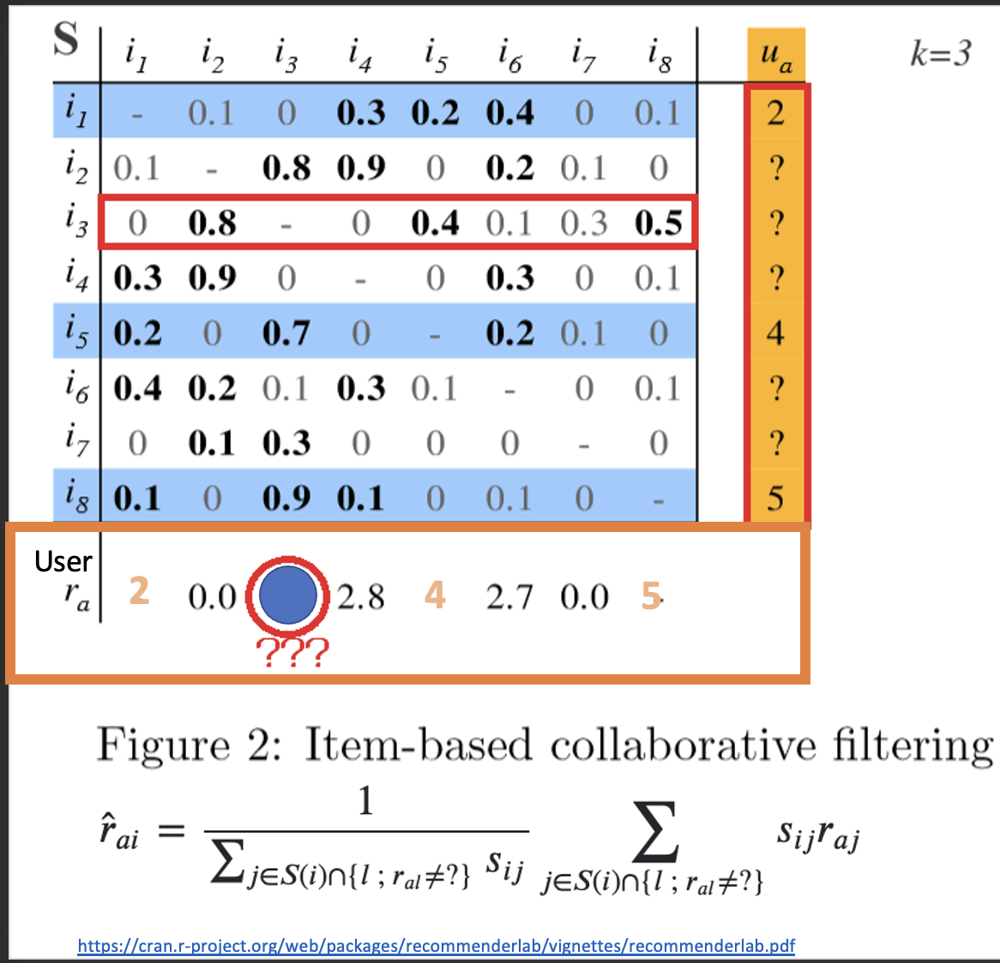

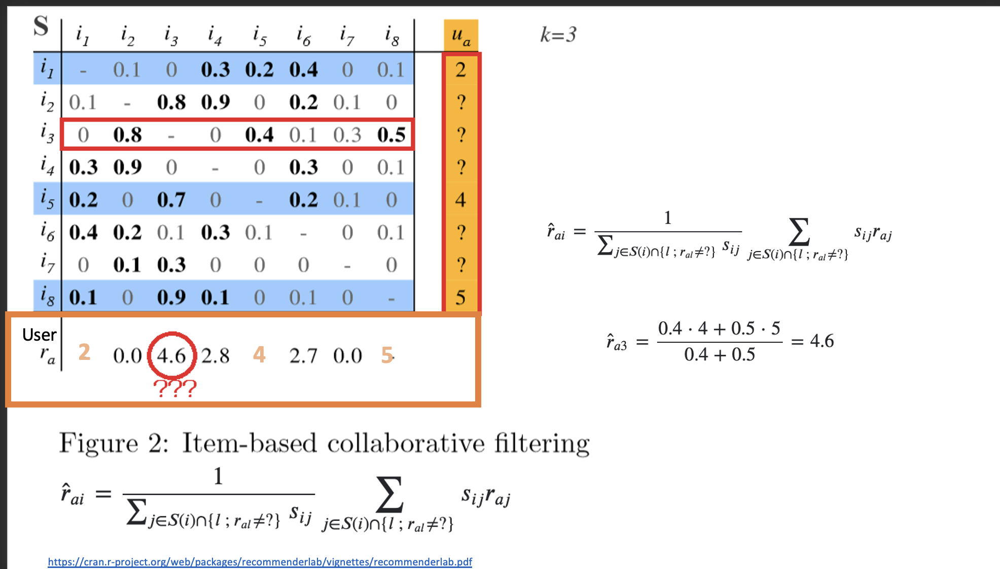

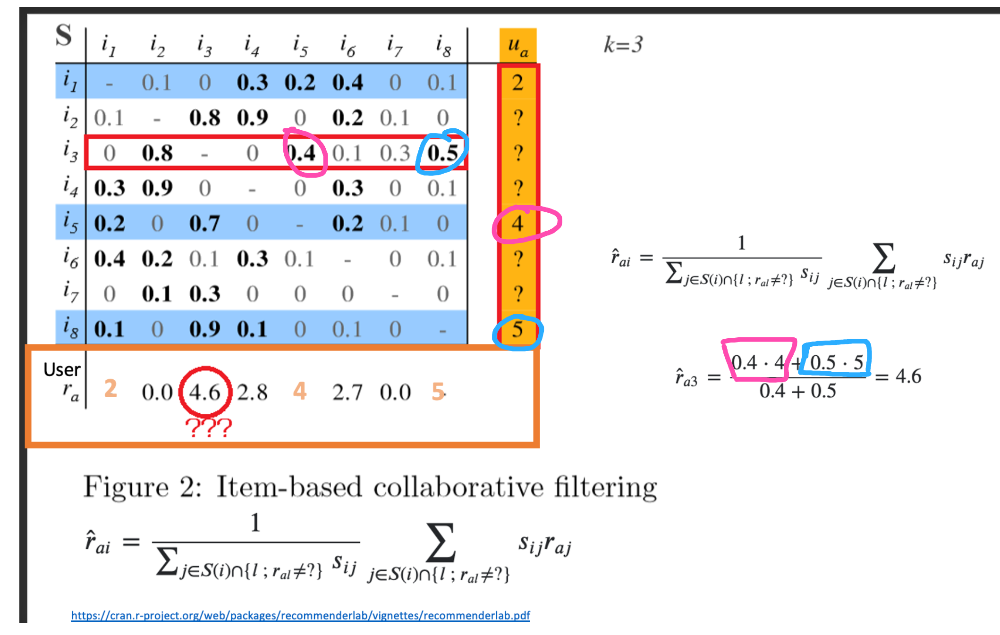

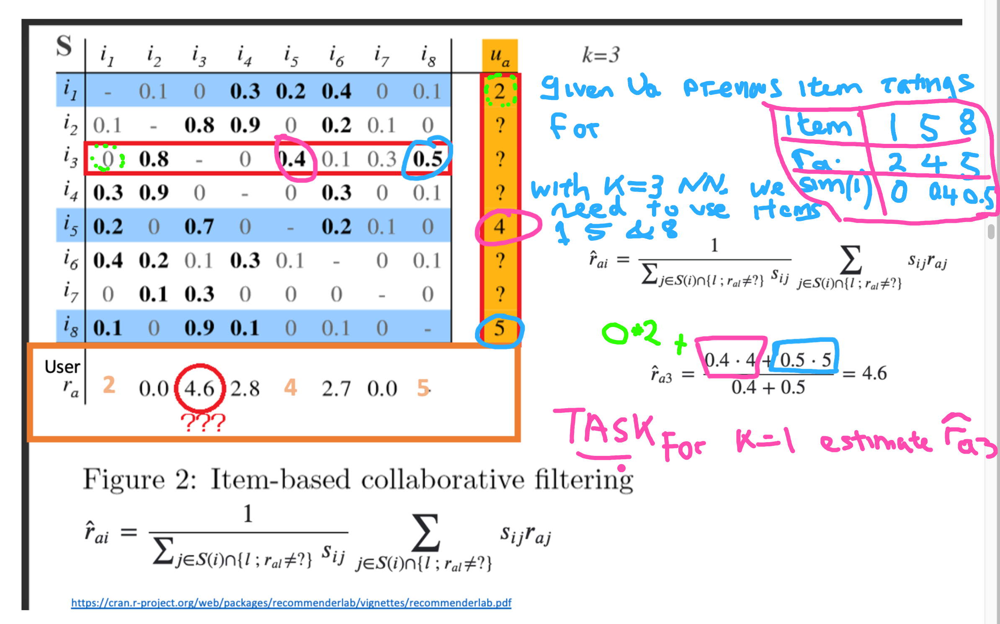

For k=1, $\hat{r}_{a3}$ estimated to be ZERO  based on the most similar item to item 3 being $i_2$ but  user $U_a$ has a zero rating for $i_2$. Since  $\hat{r}_a2$ is 0  $\hat{r}_a3$ will be 0 also $K=1$ item-to-item similarity matrix

### Other variations of item-to-item based similarity based recommendations

NOTE in the following $I$ denotes the number of neighbors stored for each item in the item-to-item similarity matrix.

For details please see:
* https://towardsdatascience.com/comprehensive-guide-on-item-based-recommendation-systems-d67e40e2b75d

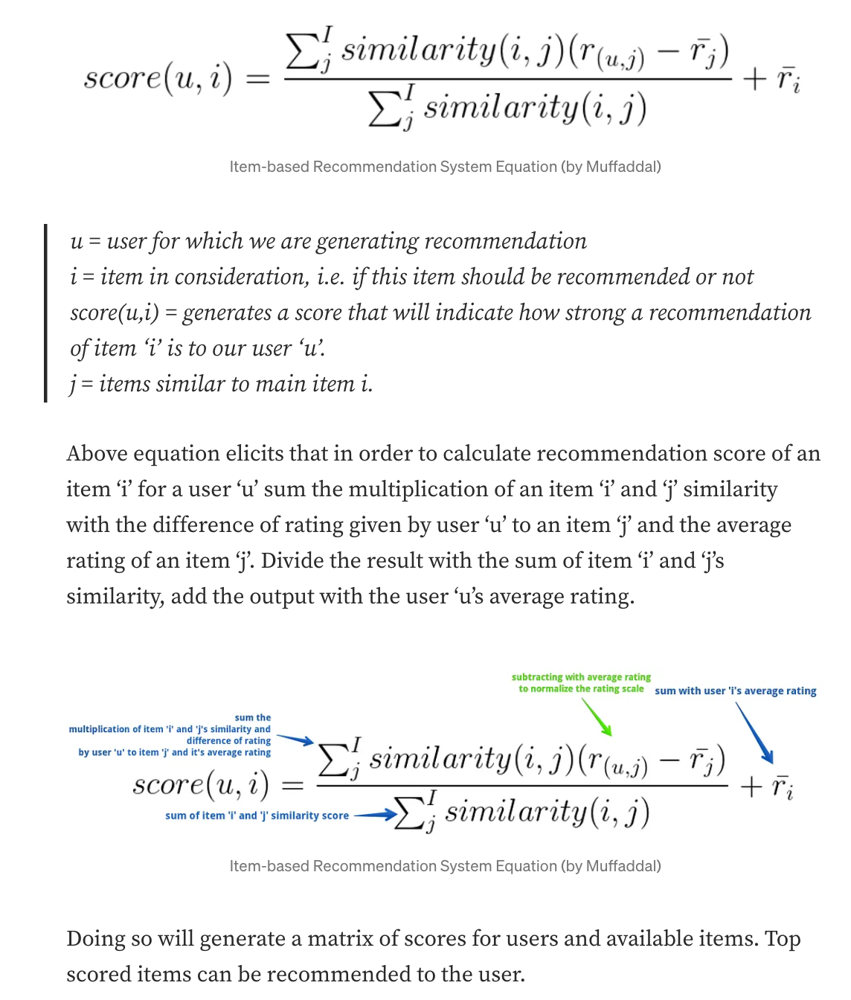

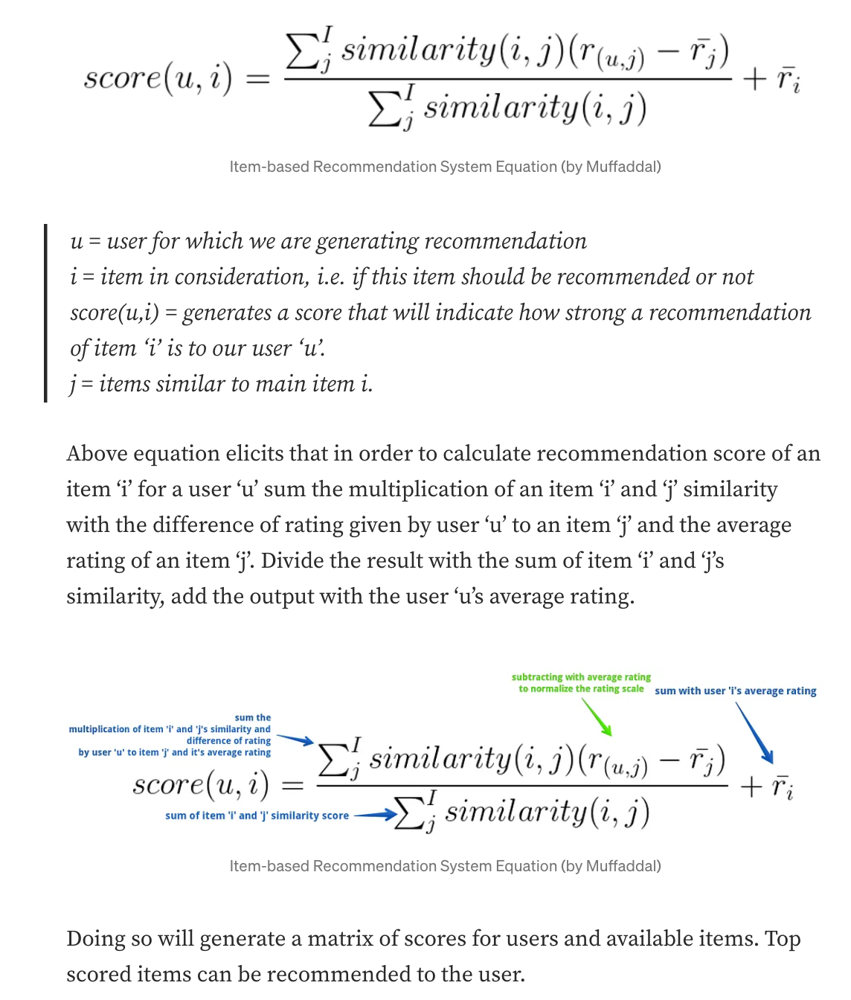# Representation

## Recommender System (RS) as bipartite graph

We can think of the recommender problem as a weighted bipartite graph, where one set of nodes represents users, and the other set represents items. 

* __NODES__ - Each user can be represented by a vector of features, thinkgs like preferences, demographics, traits, etc.. and likewise, our items can also be represented by feature vectors. For example, if our items are movies, then we might have features like genre, director, lead actor, etc... (We'll talk about how these features are derived later).  

* __EDGES__ - The edges in our graph could be ratings, a positive or negative indicator, or another continuous measure of preference.

<img src="https://raw.githubusercontent.com/UCB-w261/w261-environment/master/notebook-images/week13/bipartite-graph.png" width="50%">   

# Content-based
Content-Based systems focus on properties of items. Similarity of items is determined by measuring the similarity in their properties. If a user bought a particular item, then we can recommend similar items. Early recommender systems employed this approach. 

This approach depends heavily on the similarity metrics beteen items and feature engineering. For movies that might be genre, lead actors, etc. When comparing news articles we might want to perform some topic modeling, TFIDF, cosine similarities, etc..

We represent each item as a vector of features, and each user as a vector of these item features, and we compute the cosine similarity between a user and an item to determine if the user will like this item.

While it was intuitive and easily interpretable, more effective methods have been developed since. 

Pros: interpretable, no cold start problem, makes use of implicit data collection .  
Cons: creates filter bubble

# Collaborative Filtering

## Neighborhood Based
As discussed in DDS, we could now take a Nearest Neighbor approach, which is intuitive and simple to reason about. The intuition being that similar people like similar things.

### Discussion questions:
1. How can we measure similarity between people? (HINT: Think about the person node representation)
2. What are the challenges with this approach from a theoretical standpoint, as well as a computational one?

### <--- SOLUTION --->
1. Jaccard, cosine, euclidean
> 
    One example when the opinions are binary:
    Jaccard distance, i.e., 1–(the number of things they both like divided
    by the number of things either of them likes)
    DDS pg.202

2. 
> 
    * Curse of dimensionality
    * Overfitting
    * Correlated features
    * Relative importance of features
    * Sparseness
    * Measurement errors
    * Computational complexity
    * Sensitivity of distance metrics
    * Preferences change over time
    * Cost to update

## Model Based


__2.2.2 Model-Based Filtering__
Model-based techniques make use of data mining and machine learning approaches
to predict the preference of a user to an item. These techniques include 
* association rule mining, (Apriori)
* clustering, 
* decision tree, 
* artificial neural network, 
* Bayesian classifier, 
* regression, 
* link analysis, and 
* __latent factor models.__   

Among these, __latent factor models__ are the most studied and used model-based techniques.
These techniques perform dimensionality reduction over user–item preference matrix
and learn latent variables to predict preference of the user to an item in the recommendation
process. These methods include:
* __matrix factorization__, 
* singular value decomposition, 
* probabilistic matrix factorization, 
* Bayesian probabilistic matrix factorization, 
* low-rank factorization, 
* nonnegative matrix factorization, and 
* latent Dirichlet allocation.   

Source: https://www.researchgate.net/publication/328640457_Recommendation_Systems_Techniques_Challenges_Application_and_Evaluation_SocProS_2017_Volume_2

# Data collection - implicit vs explicit feedback
Before we dive in to the methodology, let's talk about how the system is popuated in the first place?


## Explicit feedback - users provide ratings.

### Discussion questions: 
* What are some of the limitations of star ratings?


### <--- SOLUTION --->

* This approach is limited in its effectiveness, since generally
users are unwilling to provide responses, and the information from those
who do may be biased by the very fact that it comes from people willing
to provide ratings. MMDS pg.311
* People lie.
* People don't have the ability to accurately measure on a scale
* People's tastes change over time
* Some people rate higher overall, some people generally rate lower. ie, rating are not equivalent across users.


<img src="https://raw.githubusercontent.com/UCB-w261/w261-environment/master/notebook-images/week13/star_ratings.png" width="30%">   

### Digression: Yahoo experiment -   
<img src="https://raw.githubusercontent.com/UCB-w261/w261-environment/master/notebook-images/week13/yahoo-experiment.png" width="40%">   

* On the left - When users are asked to rate movies from a random list, there are many very low ratings.
* On the right - When the user has the freedom to choose what items to rate, instead of giving a low rating, they don’t give a rating at all.    

These two distributions are very different. The challenge is that we have this data for training and testing where the "true" distribution is like one on the left, but the model we build (user experience) depends on the distribution on the right.
We can reframe this challenge in terms of missing data. And what this means, is that we cannot make the assumption that the data is missing at random. The consequence is that we cannot ignore missing values, instead, we need a mechanism for imputing those values.   
For more information and how this issue can be addressed, see https://www.youtube.com/watch?v=aKQfUbxU96c marker 6:00

## Implicit feedback - We can make inferences from users’ behavior. 
If a user buys a product at Amazon, watches a movie on YouTube, or reads a news article, then the user can be said to “like” this item.

### Discussion questions:
* What are some of the challenges of this approach?
* Ex: If I click on a movie but don't watch it, is that a positive or negative indicator?

## Matrix Factorization

We'll limit our implementation to explicit feedback given by users in the form of ratings. We might want to do some preprocessing, like normalization. For example, we might want to subtract the mean of the ratings to account for user bias - some users tend to rate higher than others, and vs. And we may or may not want to impute missing values, as discussed above.

We can represent our bipartite graph by a $n\times m$ "utility" matrix $R$ with entries $r_{u,i}$ representing the $i$th item rating by user $u$ with $n$ users and $m$ items.

Our goal is to fill in the missing (or previously imputed) values of our matrix with good estimates of future ratings. 

A common approach for this problem is matrix factorization where we make estimates for the complete ratings matrix $R$ in terms of two matrix "factors" $U$ and $V$ which multiply together to form $R$. Where $U$ is the user matrix and $V$ is the item matrix.

$$
R \approx UV
$$

We can estimate $R$ by creating factor matricies with reduced complexity $U\in\mathbb{R}^{k,n}$ and $V"\in\mathbb{R}^{k,m}$ with $n$ users, $m$ items, and $k$ factors.

### Prediction 
If we multiply each feature of the user by the corresponding feature of the movie and add everything together, this will be a good approximation for the rating the user would give that movie.

$$
r'_{u,i} = \boldsymbol{u}^{T}_{u}\boldsymbol{v}_{i} = \sum_{k} u_{u,k}v_{k,i}
$$

#### Assumptions
- Each user can be described by $k$ attributes or features. For example, feature 1 might be a number that says how much each user likes sci-fi movies; however, they are ambiguous since the model derives them similar to a neural network. So we do not get the interpretability.
- Each item (movie) can be described by an analagous set of $k$ attributes or features. To correspond to the above example, feature 1 for the movie might be a number that says how close the movie is to pure sci-fi.

These user and item vectors are often called latent vectors or low-dimensional embeddings.

### Discussion questions:
* What is a latent factor? Intuitively? Mathematically?
* How many latent factors should we choose? What would it mean if we had 1 latent factor? What about if we had too many? HINT: how does it relate to underfitting and overfitting



<img src="https://raw.githubusercontent.com/UCB-w261/w261-environment/master/notebook-images/week13/MF-01.png" width="40%">   


### <--- SOLUTION --->
* What is a latent factor? Intuitively? Mathematically?
>Some "aspect" of a user or item that captures several characteristics of a user or item. Mathematically, we can think of it as a projection of the feature vector onto a lower dimension.

* How many latent factors should we choose? What would it mean if we had 1 latent factor? What about if we had too many? 
>It is possible to tune the expressive power of the model by changing the number of latent factors. It has been demonstrated that a matrix factorization with one latent factor is equivalent to a most popular or top popular recommender (e.g. recommends the items with the most interactions without any personalization). Increasing the number of latent factors will improve personalization, therefore recommendation quality, until the number of factors becomes too high, at which point the model starts to overfit and the recommendation quality will decrease. A common strategy to avoid overfitting is to add regularization terms to the objective function. https://en.wikipedia.org/wiki/Matrix_factorization_(recommender_systems)

## Training - Alternating Least Sqaures (ALS)
### How can we find U and V to approximate R?
* What are we trying to optimize?       
* What do we start with?
* Explain the 3 components of this loss function. 

$$
\Vert R- U\cdot V\Vert ^2 + \lambda \Vert U \Vert ^2 + \lambda \Vert V \Vert ^2 
$$

* There is something left out of the notation shown, what is it? (hint: are we really computing the loss for every cell?)
* Why wouldn't we use GD on this loss function?


Turns out that minimizing the joint optimaztion is hard. For one, this function is not convex, so there are local minima we could "get stuck in". 

This is where ALS comes in. It turns out if we constrain $U$ or $V$ to be constant, that this is a convex problem since the multiplicative factor is a constant and it has the same matrix notation as standard least square regression.

__STEPS__

- Initialize $U_0$ and $V_0$   
- Holding $U$ constant, solve for $V_1$ to minimize:

$$
L(V) = \Vert R- U_0\cdot V\Vert ^2 + \lambda \Vert V \Vert ^2
$$

- Holding $V$ constant, solve for $U_1$ to minimize:$   

$$
L(U) = \Vert R- V_1\cdot U\Vert ^2 + \lambda \Vert U \Vert ^2
$$

- Repeat until convergence

### Discussion questions:
* When we say “solve” for $U_i$ and $V_i$, how is that actually done?
* Where are there opportunities to parallelize this training process?
* How will we partition the data to avoid shuffling?


# Parallel ALS


<img src="https://raw.githubusercontent.com/UCB-w261/w261-environment/master/notebook-images/week13/parallel-ALS.png" width="40%">   


### Discussion questions
* What data needs to be cached/ broadcast at each phase?
* What happens in ‘mappers’ (narrow transformations) & what will happen in aggregation (wide transformations)?
* How many shuffles per iteration?
* Are there any limitations to this approach?


### Spark block-by-block
Blocked implementation https://distributedml2017.files.wordpress.com/2017/01/implementing-large-scale-matrix-factorization-on-apache-spark.pdf

# Recommender-System Evaluation
>‘What constitutes a good recommender system and how to measure it’ might seem like a simple question to answer, but it is actually quite difficult.  For many years, the recommender-systems community focused on accuracy. 
>
>Accuracy, in the broader sense, is easy to quantify: numbers like error rates such as the difference between a user’s actual rating of a movie and the previously predicted rating by the recommender system (the lower the error rate, the better the recommender system); or precision, i.e. the fraction of items in a list of recommendations that was actually bought, viewed, clicked, etc. (the higher the precision, the better the recommender system). 
>
>Recently, the community’s attention has shifted to other measures that are more meaningful but also more difficult to measure including __serendipity__, __novelty__, and __diversity__. I contributed to this development by critically analyzing the state of the art [15] ; comparing evaluation metrics (click-through rate, user ratings, precision, recall, …) and methods (online evaluations, offline evaluations, user studies) [13] as well as introducing novel evaluation methods [3].
>
>Regardless of the metrics used to measure how “good” a recommender system is (accuracy, precision, user satisfaction…), studies report surprisingly inconsistent results on how effective different recommendation algorithms are. For instance, as shown in Figure 2, one of my experiments shows that five news recommendation-algorithms perform vastly different on six news websites [5]. Almost every algorithm performed best on at least one news website. Consequently, the operator of a new news website would hardly know which of the five algorithms is the best to use, because any one could potentially be it.  ~Joeran Beel   
*Dr Joeran Beel is an Ussher Assistant Professor in the Artificial Intelligence Discipline at the School of Computer Science & Statistics at Trinity College Dublin.* https://www.tcd.ie/research/researchmatters/joeran-beel.php

### Notebook Set-Up

In [1]:
# imports
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from os import path

In [19]:
# store path to notebook
PWD = '/media/Instructors/LiveSessionMaterials/wk12Demo_ALS/master'
PWD ="." #comment this for execution on the cloud

In [3]:
from pyspark.sql import SparkSession
app_name = "wk11_demo"
master = "local[*]"
spark = SparkSession\
        .builder\
        .appName(app_name)\
        .master(master)\
        .getOrCreate()
sc = spark.sparkContext

:: loading settings :: url = jar:file:/usr/lib/spark/jars/ivy-2.4.0.jar!/org/apache/ivy/core/settings/ivysettings.xml


Ivy Default Cache set to: /root/.ivy2/cache
The jars for the packages stored in: /root/.ivy2/jars
graphframes#graphframes added as a dependency
org.apache.spark#spark-avro_2.12 added as a dependency
:: resolving dependencies :: org.apache.spark#spark-submit-parent-78c05985-1ea6-47ce-9c0e-a317e4fe0700;1.0
	confs: [default]
	found graphframes#graphframes;0.8.2-spark3.1-s_2.12 in spark-packages
	found org.slf4j#slf4j-api;1.7.16 in central
	found org.apache.spark#spark-avro_2.12;3.1.3 in central
	found org.spark-project.spark#unused;1.0.0 in central
:: resolution report :: resolve 255ms :: artifacts dl 5ms
	:: modules in use:
	graphframes#graphframes;0.8.2-spark3.1-s_2.12 from spark-packages in [default]
	org.apache.spark#spark-avro_2.12;3.1.3 from central in [default]
	org.slf4j#slf4j-api;1.7.16 from central in [default]
	org.spark-project.spark#unused;1.0.0 from central in [default]
	---------------------------------------------------------------------
	|                  |            mo

## About the Data
https://grouplens.org/datasets/movielens/

MovieLens data sets were collected by the GroupLens Research Project at the University of Minnesota.

This data set consists of: 
* 100,000 ratings (1-5) from 943 users on 1682 movies. 
* Each user has rated at least 20 movies. 
* Simple demographic info for the users (age, gender, occupation, zip)



In [20]:
# make data directory if it doesn't already exist

!mkdir -p {PWD}/data
!curl https://www.dropbox.com/s/yk72grsouyw018l/test.data.txt?dl=1 -o {PWD}/data/test.data
!curl http://files.grouplens.org/datasets/movielens/ml-latest-small.zip -o {PWD}/data/data-ml-latest-small.zip
!curl http://files.grouplens.org/datasets/movielens/ml-10m.zip -o {PWD}/data/data-ml-10m.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   120    0   120    0     0    219      0 --:--:-- --:--:-- --:--:--   219
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  955k  100  955k    0     0  1284k      0 --:--:-- --:--:-- --:--:-- 1283k
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 62.5M  100 62.5M    0     0  16.2M      0  0:00:03  0:00:03 --:--:-- 16.1M


In [9]:
! apt-get install unzip

Reading package lists... Done
Building dependency tree       
Reading state information... Done
Suggested packages:
  zip
The following NEW packages will be installed:
  unzip
0 upgraded, 1 newly installed, 0 to remove and 45 not upgraded.
Need to get 166 kB of archives.
After this operation, 543 kB of additional disk space will be used.
Get:1 http://deb.debian.org/debian buster/main arm64 unzip arm64 6.0-23+deb10u2 [166 kB]
Fetched 166 kB in 2s (105 kB/s)
debconf: delaying package configuration, since apt-utils is not installed
Selecting previously unselected package unzip.
(Reading database ... 24899 files and directories currently installed.)
Preparing to unpack .../unzip_6.0-23+deb10u2_arm64.deb ...
Unpacking unzip (6.0-23+deb10u2) ...
Setting up unzip (6.0-23+deb10u2) ...
Processing triggers for mime-support (3.62) ...


In [21]:
!rm -rf {PWD}/data/ml*
!unzip {PWD}/data/data-ml-latest-small.zip -d {PWD}/data/
!unzip {PWD}/data/data-ml-10m.zip -d {PWD}/data/

Archive:  ./data/data-ml-latest-small.zip
   creating: ./data/ml-latest-small/
  inflating: ./data/ml-latest-small/links.csv  
  inflating: ./data/ml-latest-small/tags.csv  
  inflating: ./data/ml-latest-small/ratings.csv  
  inflating: ./data/ml-latest-small/README.txt  
  inflating: ./data/ml-latest-small/movies.csv  
Archive:  ./data/data-ml-10m.zip
   creating: ./data/ml-10M100K/
  inflating: ./data/ml-10M100K/allbut.pl  
  inflating: ./data/ml-10M100K/movies.dat  
  inflating: ./data/ml-10M100K/ratings.dat  
  inflating: ./data/ml-10M100K/README.html  
  inflating: ./data/ml-10M100K/split_ratings.sh  
  inflating: ./data/ml-10M100K/tags.dat  


In [11]:
! apt-get install tree

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following NEW packages will be installed:
  tree
0 upgraded, 1 newly installed, 0 to remove and 45 not upgraded.
Need to get 48.2 kB of archives.
After this operation, 117 kB of additional disk space will be used.
Get:1 http://deb.debian.org/debian buster/main arm64 tree arm64 1.8.0-1 [48.2 kB]
Fetched 48.2 kB in 0s (178 kB/s)
debconf: delaying package configuration, since apt-utils is not installed
Selecting previously unselected package tree.
(Reading database ... 24917 files and directories currently installed.)
Preparing to unpack .../tree_1.8.0-1_arm64.deb ...
Unpacking tree (1.8.0-1) ...
Setting up tree (1.8.0-1) ...


In [22]:
!tree {PWD}/data/

./data/
├── data-ml-10m.zip
├── data-ml-latest-small.zip
├── ml-10M100K
│   ├── README.html
│   ├── allbut.pl
│   ├── movies.dat
│   ├── ratings.dat
│   ├── split_ratings.sh
│   └── tags.dat
├── ml-latest-small
│   ├── README.txt
│   ├── links.csv
│   ├── movies.csv
│   ├── ratings.csv
│   └── tags.csv
└── test.data

2 directories, 14 files


...

## Python - Single Node Implementation

In [23]:
import pandas as pd 
from pathlib import Path
import os #os.path.join()

baseDir = f"{PWD}/data/ml-10M100K"

# The MovieLens dataset contains 10,000,054 ratings and 95580 tags applied to 10681 movies by 71567 users.

rating_headers = ['user_id', 'movie_id', 'rating', 'timestamp']
ratings = pd.read_table(os.path.join(baseDir,'ratings.dat'), sep='::', header=None, names=rating_headers)

movie_headers = ['movie_id', 'title', 'genres']
movies = pd.read_table(os.path.join(baseDir,'movies.dat'), sep='::', header=None, names=movie_headers)
movie_titles = movies.title.tolist()

df = movies.join(ratings, on=['movie_id'], rsuffix='_r')
del df['movie_id_r']
df.head()

,movie_id,title,genres,user_id,rating,timestamp
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,1,5.0,838983525
1,2,Jumanji (1995),Adventure|Children|Fantasy,1,5.0,838983392
2,3,Grumpier Old Men (1995),Comedy|Romance,1,5.0,838983421
3,4,Waiting to Exhale (1995),Comedy|Drama|Romance,1,5.0,838983392
4,5,Father of the Bride Part II (1995),Comedy,1,5.0,838983392


In [25]:
# Getting R  Rating matrix (user x movie matrix)

rp = df.pivot_table(columns=['movie_id'],index=['user_id'],values='rating').fillna(0)
display(rp.head())
R = rp.values #ratings
print(f"{R.shape[0]} users, {R.shape[1]} movies")

movie_id,1,2,3,4,5,6,7,8,9,10,...,65006,65011,65025,65027,65037,65088,65091,65126,65130,65133
user_id,,,,,,,,,,,,,,,,,,,,,
1,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


303 users, 10681 movies


In [35]:
# build a binary weight matrix (so the algo focuses on say the movies a user rated during each subproblem 
# (each user can be view as an atomic problem to be solved) that is solved)
#-----------------------------------------------------
# small unit test for the error calculation
import numpy as np
W = Q>0.5
W[W == True] = 1
W[W == False] = 0
# To be consistent with our Q matrix
W = W.astype(np.float64, copy=False)
lambda_ = 0.1 # learning rate
n_factors = 100
m, n = Q.shape

#setup user and movie factor matrices of order n_factors between [0, 5] stars
U = 5 * np.random.rand(m, n_factors) 
V = 5 * np.random.rand(n_factors, n)
print(U.shape)

#compute the error (Frobenus norm) where
# Q target ratings matrix
# X and Y are the factorized matrices
# W weight matrix
def get_error(Q, U, V, W):
    """ where W is a mask of actual ratings """
    return np.mean((W * (Q - np.dot(U, V)))**2) 

print(W) #mask

(303, 100)
[[1. 1. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 1. 1. 1.]]


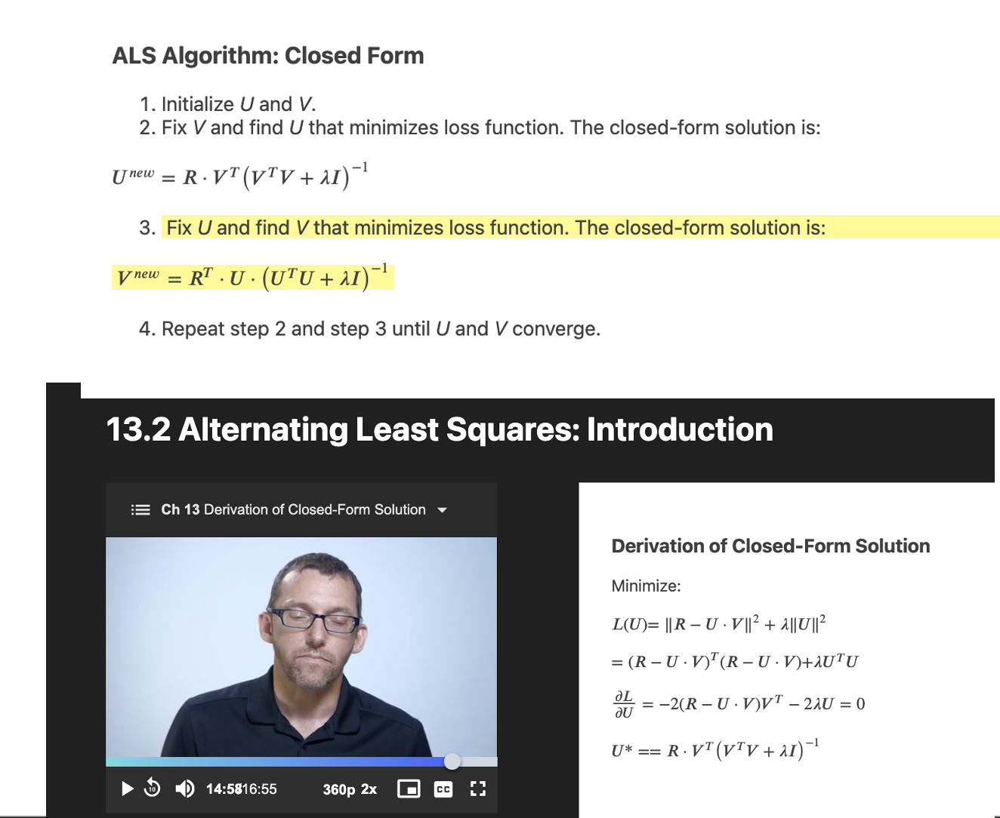

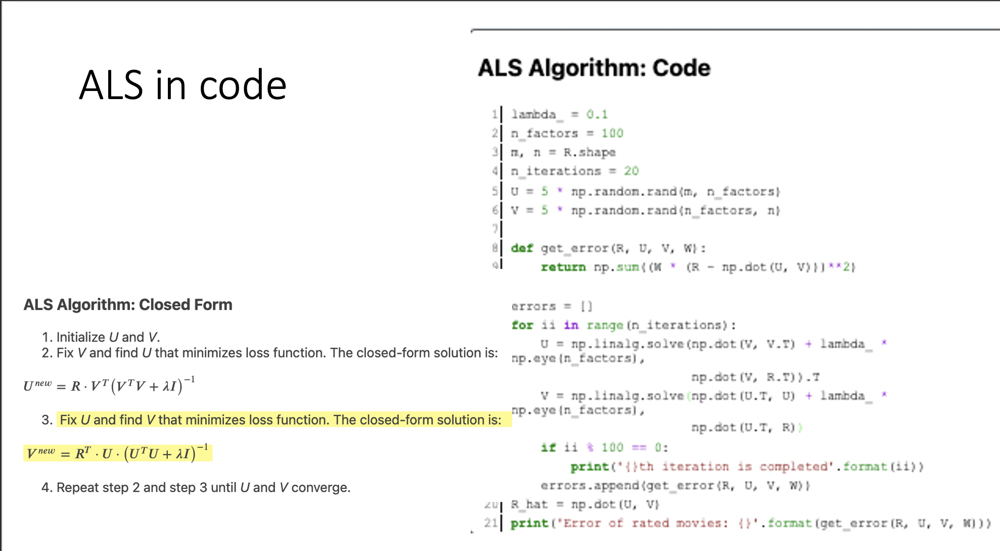

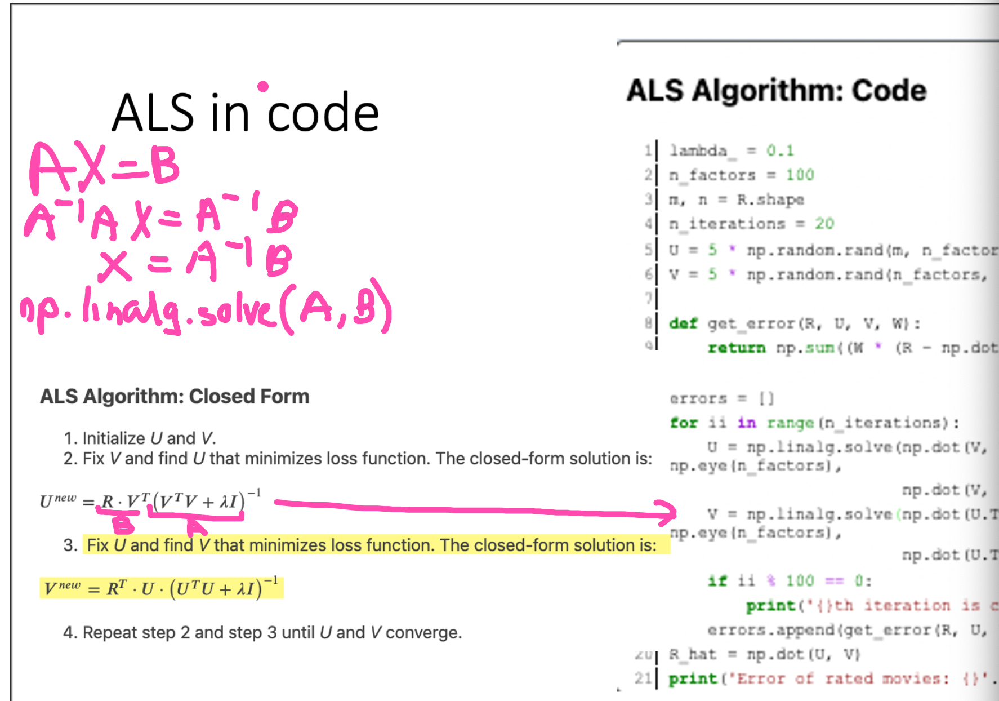

$$L(U) = ||R - UV||^2 + ||U||^2$$ 
$$L(V) = ||R - UV||^2 + ||V||^2$$ 

### ALS Algorithm: Closed form

1. Initialize U and V
2. Fix V and find U that minimizes the loss function. Take derivative of the loss function and this leads to a closed form solution for U as follows:
  * $U^{new} = R  V^T(V^TV +\lambda I)^{-1} $
3. Fix U and find V that minimizes the loss function. Take derivative of the loss function wrt V and this leads to a closed form solution for U as follows:
  * $V^{new} = R  U^T(U^TU +\lambda I)^{-1} $
4. Repeat steps 2 and 3 until $U$ and $V$ converge or for a fixed number of iterations

In [43]:
%%time 
# W is a binary weight matrix (so the algo focuses on say the movies a user rated during each subproblem) 
# (each user can be viewed as an atomic problem to be solved) that is solved)
# NOTEL non-weighted version of ALS (does not work well!)
# uses all user item values (as opposed to the subset of actual ratings)
n_iterations = 20

errors = []
for i in range(n_iterations): 
    # Ridge regression for user embeddinga (U)
    # AX=B =>  X=A^-1B ; in python use solve(A, B) 
    # R_hat = UV;   U = inv(V) R and  V = inv(U) R 
    # W is a mask of true item-user rating
    U = np.linalg.solve(np.dot(V, V.T) + lambda_ * np.eye(n_factors),  np.dot(V, R.T)).T
    V = np.linalg.solve(np.dot(U.T, U) + lambda_ * np.eye(n_factors),  np.dot(U.T, R))
    print(f'{i}th iteration is completed MSE {get_error(R, U, V, W)}')
    errors.append(get_error(R, U, V, W))
R_hat = np.dot(U, V)

print('')
print(f'Error of rated movies: {get_error(R, U, V, W)}') # W is a mask

0th iteration is completed MSE 0.004948527295233463
1th iteration is completed MSE 0.0048498672373545
2th iteration is completed MSE 0.004835244281438724
3th iteration is completed MSE 0.0048417198576278485
4th iteration is completed MSE 0.004852480770268927
5th iteration is completed MSE 0.004862095286149938
6th iteration is completed MSE 0.004869613407957149
7th iteration is completed MSE 0.004875376114718865
8th iteration is completed MSE 0.004879871829333447
9th iteration is completed MSE 0.00488347506698254
10th iteration is completed MSE 0.004886438203986157
11th iteration is completed MSE 0.004888927404875979
12th iteration is completed MSE 0.004891053708008477
13th iteration is completed MSE 0.004892893524893857
14th iteration is completed MSE 0.004894501232941712
15th iteration is completed MSE 0.004895916828173513
16th iteration is completed MSE 0.004897170638594572
17th iteration is completed MSE 0.004898286295602856
18th iteration is completed MSE 0.004899282657212128
19th 

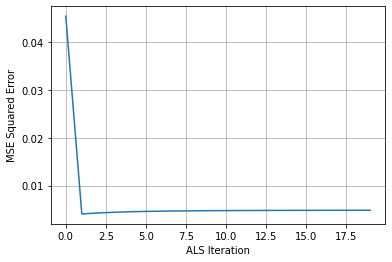

In [38]:
import matplotlib.pyplot as plt
# display plots inline (otherwise it will fire up a separate window)
%matplotlib inline
plt.plot(errors);
#plt.ylim([12500, 20000]);
#plt.ylim([0, 20000]);
plt.xlabel("ALS Iteration")
plt.ylabel("MSE Squared Error")
plt.grid()

### MASKED record by record solution in numpy on a single core

0th iteration is completed
1th iteration is completed
2th iteration is completed
3th iteration is completed
4th iteration is completed
5th iteration is completed
6th iteration is completed
7th iteration is completed
8th iteration is completed
9th iteration is completed
10th iteration is completed
11th iteration is completed
12th iteration is completed
13th iteration is completed
14th iteration is completed
15th iteration is completed
16th iteration is completed
17th iteration is completed
18th iteration is completed
19th iteration is completed
Error of rated movies: 2.0828854902386834e-06
CPU times: user 3h 7min 13s, sys: 28min 21s, total: 3h 35min 35s
Wall time: 36min 41s


Text(0, 0.5, 'Mean Squared Error')

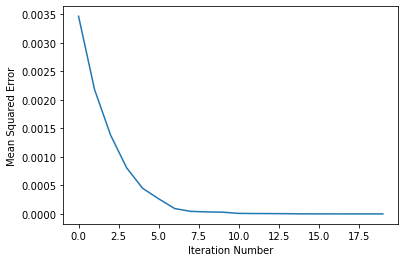

In [44]:
%%time 
# record by record solution
# this is su
weighted_errors = []
for ii in range(n_iterations):
    for u, Wu in enumerate(W):
        #AX=B =>  X=A^-1B ; in python use solve(A, B) 
        U[u] = np.linalg.solve(np.dot(V, np.dot(np.diag(Wu), V.T)) + lambda_ * np.eye(n_factors),
                               np.dot(V, np.dot(np.diag(Wu), R[u].T))).T
    for i, Wi in enumerate(W.T):
        V[:,i] = np.linalg.solve(np.dot(U.T, np.dot(np.diag(Wi), U)) + lambda_ * np.eye(n_factors),
                                 np.dot(U.T, np.dot(np.diag(Wi), R[:, i])))
    weighted_errors.append(get_error(R, U, V, W))
    print(f'{ii}th iteration is completed') 
weighted_R_hat = np.dot(U,V) #masked R_hat
print(f'Error of rated movies: {get_error(R, U, V, W)}')
plt.plot(weighted_errors);
plt.xlabel('Iteration Number');
plt.ylabel('Mean Squared Error');

## Spark - Distributed Implementation - # record by record solution|


<img src="https://raw.githubusercontent.com/UCB-w261/w261-environment/master/notebook-images/week13/parallel-ALS.png" width="40%">   


In [ ]:
import numpy as np
from numpy.random import rand
from numpy import matrix


In [ ]:
def rmse(R, U, V): # Metric
    return np.sqrt(np.sum(n
                          p.power(R-U*V, 2))/(U.shape[0]*V.shape[1]))

In [ ]:
def solver(mat, R, LAMBDA):  # solver to get R * mat(mat T*mat + lambda*I)^-1
    d1 = mat.shape[0]
    d2 = mat.shape[1]
    X2 = mat.T * mat
    XY = mat.T * R.T
    for j in range(d2):
        X2[j, j] += LAMBDA * d1

    return np.linalg.solve(X2, XY)



In [ ]:
# Not only caculation is paralleized but also the data is wisely partitioned and shared to improve locality.
def closedFormALS(R,InitialU,InitialVt,rank,iterations,numPartitions,LAMBDA=0.01):
    R_Userslice = sc.parallelize(R,numPartitions).cache() # R will automaticly be partitioned by row index
    R_Itemslice = sc.parallelize(R.T,numPartitions).cache() # R_T will automaticly be partitioned by row index
    U = InitialU
    Vt = InitialVt
    
    for i in range(iterations):
        
        print(f"Iteration: {i}")
        print(f"RMSE: {rmse(R, U, Vt.T)}")
        
        Vtb = sc.broadcast(Vt)
        U3d = R_Userslice.map(lambda x:solver(Vtb.value,x,LAMBDA)).collect() # a list of two 2-D matrix
        U = matrix(np.array(U3d)[:, :, 0]) # transfered to 2-D matrix
        
        Ub = sc.broadcast(U)
        Vt3d = R_Itemslice.map(lambda x:solver(Ub.value,x,LAMBDA)).collect() # a list of two 2-D matrix
        Vt = matrix(np.array(Vt3d)[:, :, 0])  # transfered to 2-D matrix
    
    return U, Vt 

In [ ]:
# Only parallelize the calculation. It does not consider the data transmission cost
def simpleParalleling(R,InitialU,InitialVt,rank,iterations,numPartitions,LAMBDA=0.01):
    Rb = sc.broadcast(R)
    U = InitialU
    Vt = InitialVt
    Ub = sc.broadcast(U)
    Vtb = sc.broadcast(Vt)
    numUsers = InitialU.shape[0]
    numItems = InitialVt.shape[0]
    
    for i in range(iterations):
        print(f"Iteration: {i}")
        print(f"RMSE: {rmse(R, U, Vt.T)}")
        U3d = sc.parallelize(range(numUsers), numPartitions) \
           .map(lambda x: solver( Vtb.value, Rb.value[x, :],LAMBDA)) \
           .collect() # a list of two 2-D matrix
        U = matrix(np.array(U3d)[:, :, 0]) # transfered to 2-D matrix
        Ub = sc.broadcast(U)

        Vt3d = sc.parallelize(range(numItems), numPartitions) \
           .map(lambda x: solver(Ub.value, Rb.value.T[x,:],LAMBDA)) \
           .collect() # a list of two 2-D matrix
        Vt = matrix(np.array(Vt3d)[:, :, 0]) # transfered to 2-D matrix
        Vtb = sc.broadcast(Vt)
    return U, Vt

In [ ]:
def main():
    LAMBDA = 0.01   # regularization parameter
    np.random.seed(100)
    numUsers = 5000
    numItems = 100
    rank = 10
    iterations = 5
    numPartitions = 4

    trueU = matrix(rand(numUsers, rank)) #True matrix U to generate R
    trueV = matrix(rand(rank, numItems)) #True matrix V to generate R
    R = matrix(trueU*trueV)   #generate Rating matrix
    
    InitialU = matrix(rand(numUsers, rank)) #Initialization of U
    InitialVt = matrix(rand(numItems,rank)) #Initialization of V
    
    print(f"Running ALS with numUser={numUsers}, numItem={numItems}, rank={rank}, iterations={n_iterations}, numPartitions={numPartitions}")
    
    print("Distributed Version---Two copies of R, one is partitioned by rowIdx, the other is partitioned by colIndx")
    closedFormALS(R,InitialU,InitialVt,rank,n_iterations,numPartitions,LAMBDA)
    
    print("Simple paralleling ---Suppose User Matrix R is small enough to be broadcast")
    simpleParalleling(R,InitialU,InitialVt,rank,n_iterations,numPartitions,LAMBDA)

In [ ]:
main()

# Spark ML implementation of ALS

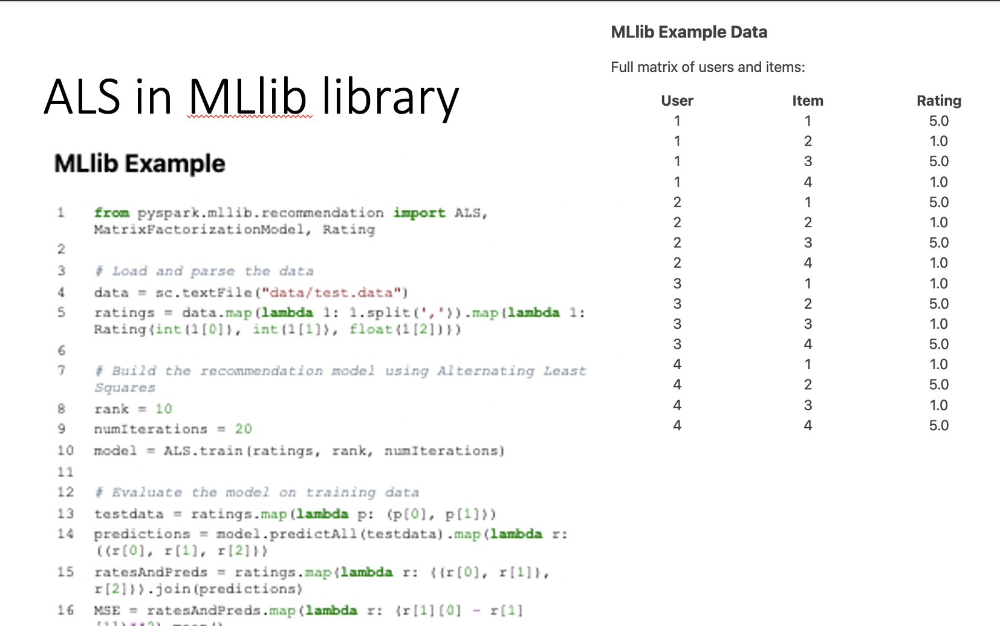

### MlLib Tutorial on Personalized Movie Recommendation
Link to Docs: https://spark.apache.org/docs/latest/mllib-collaborative-filtering.html

* What are the parameters for the MLLib implementation of collaborative filtering?
* How do you determine the ‘rank’ of your latent space vectors (i.e. number of latent factors)?
* After training your CF model a new user joins your platform. What will you need to do to generate predictions for that user?

### <--- SOLUTION --->
* What are the parameters for the MLLib implementation of collaborative filtering?
>See docs
* How do you determine the ‘rank’ of your latent space vectors (i.e. number of latent factors)?
>See discussion above - think about underfitting/overfitting. A good heuristic is 20-100 latent factors
* How to make recommendations for new users? RETRAIN   
>When using collaborative filtering, getting recommendations is not as simple as predicting for the new entries using a previously generated model. Instead, we need to train again the model but including the new user preferences in order to compare them with other users in the dataset.
That is, the recommender needs to be trained every time we have new user ratings (although a single model can be used by multiple users of course!). This makes the process expensive, and it is one of the reasons why scalability is a problem (and Spark a solution!). Once we have our model trained, we can reuse it to obtain top recomendations for a given user or an individual rating for a particular movie. These are less costly operations than training the model itself.



### Some implementation details

Solve for U and V for maxIterations
https://github.com/apache/spark/blob/e1ea806b3075d279b5f08a29fe4c1ad6d3c4191a/mllib/src/main/scala/org/apache/spark/ml/recommendation/ALS.scala#L1001
```
for (iter <- 0 until maxIter)
    itemFactors = computeFactors(userFactors, userOutBlocks, itemInBlocks, rank, regParam,
          userLocalIndexEncoder, solver = solver)
    userFactors = computeFactors(itemFactors, itemOutBlocks, userInBlocks, rank, regParam,
          itemLocalIndexEncoder, solver = solver)      
```

where the default non-negative solver is the `ML` NNLSSolver (non-negative least squares solver)     
https://github.com/apache/spark/blob/e1ea806b3075d279b5f08a29fe4c1ad6d3c4191a/mllib/src/main/scala/org/apache/spark/ml/recommendation/ALS.scala#L767

which calls `MLLIB` NNLS Solver...
which implements the [conjugate gradient method](https://en.wikipedia.org/wiki/Conjugate_gradient_method)
https://github.com/apache/spark/blob/e1ea806b3075d279b5f08a29fe4c1ad6d3c4191a/mllib/src/main/scala/org/apache/spark/mllib/optimization/NNLS.scala

## Scaling ALS in production (a case study from Yelp): custom prediction deployment

Key takeaways:

* Standard TRAIN using PySpark ALS:  train model using ALS (refactor the ratings matrix in term of the user (U) embedding and item (V) embedding)
* Custom DEPLOY the PREDICTION module: custom deployment of U and V matrices (partition U as Spark prediction was slow; 
  * they implemented a top-K prediction algorithm in PySpark using a block matrix-multiplication based technique as shown in the figure below.
  * The following paragraph provides more details of the challenge and solution:

```The idea behind the block matrix multiplication technique is to row-partition the tall and skinny user matrix and column-partition the short and wide business matrix. Once partitioned, we can parallelize matrix multiplications over these partitions.

We decided to use PySpark’s mapPartitions operation to row-partition and parallelize the user matrix. Each spark executor (located in worker nodes) will then operate on a partition, aka a chunk of rows from the user matrix.

The next challenge is to find a mechanism to make the business matrix available across all worker nodes without using the expensive crossJoin operation. One possible solution is to use the broadcast operation to distribute the business matrix. However, to use broadcasting, the entire matrix first needs to be loaded in the memory of the master node. In our use case, this wasn’t an option because the business matrix was too large in size. Instead, we copied the business matrix file directly from S3 to the worker nodes using the addFile operation.

```

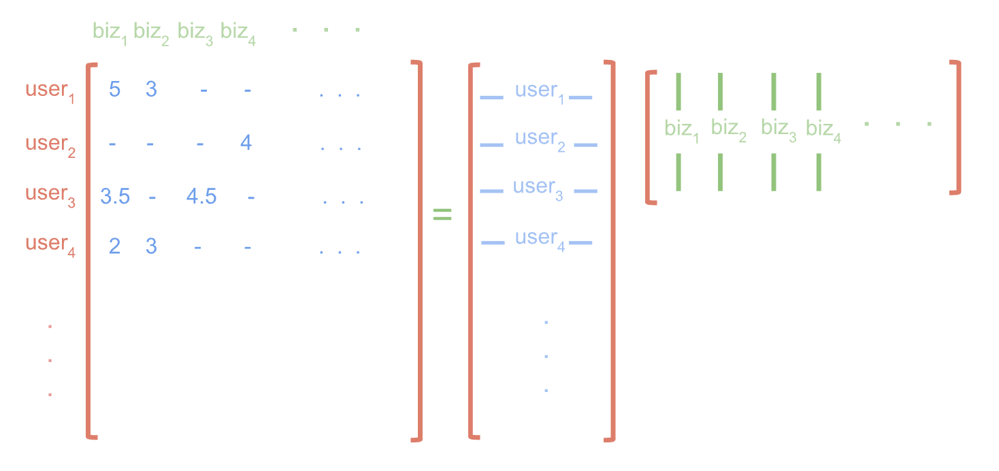

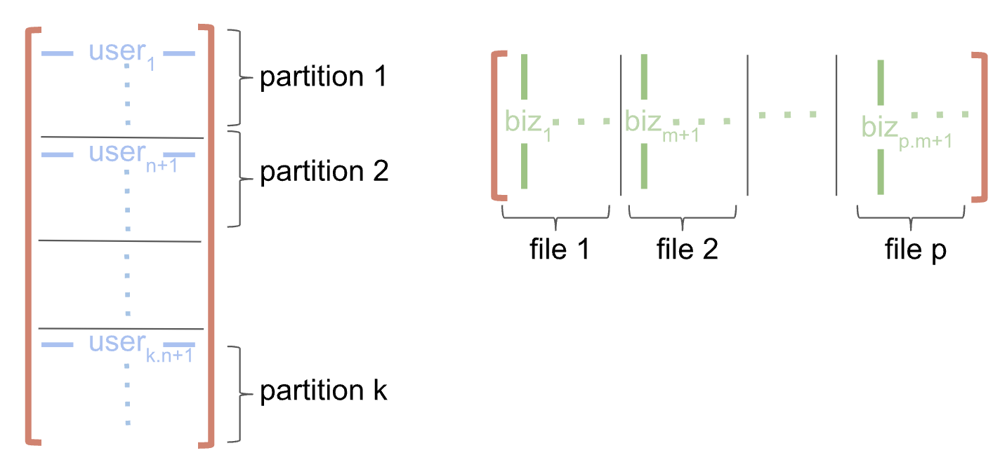

In summary, Yelp used the Spark ML library to build a distributed collaborative filtering model for their large user-business interactions dataset. Even though in their experience, the out of the box exact top-K recommendation function didn’t scale well, they were able to leverage PySpark’s highly parallel framework in conjunction with NumPy and SciPy to implement the well-known trick of block matrix multiplication to produce exact top-K recommendations for all users. In a followup post in this series, they  discuss their experience with deploying PySpark code in production as well as how they unit test their Spark code. Yelp has  open sourced ML and Spark tools for recommenders.

For more information on this exciting case study please see:

* https://engineeringblog.yelp.com/2018/05/scaling-collaborative-filtering-with-pyspark.html

# Going further

TODO: Explain why the function is not convex. https://www.quora.com/Why-is-the-matrix-factorization-optimization-function-in-recommender-systems-not-convex

>A function f(x) is said to be convex if it satisfies the following property:

>𝑓(𝛼𝑥+𝛽𝑦)≤𝛼𝑓(𝑥)+𝛽𝑓(𝑦) where, 𝛼+𝛽=1,𝛼,𝛽≥=0and the domain of 𝑓 is a convex set.

>A simple matrix factorization based model would predict, say ratings, using the product of item and user latent factors

>𝑅𝑢𝑖=<𝑝𝑢,𝑞𝑖> where 𝑝𝑢 is the user latent factor representation and 𝑞𝑖is the item latent factor representation. The objective function includes this term and therefore is equivalent to minimizing 𝑓(𝑥,𝑦)=𝑥𝑦

>𝑓(𝛼𝑥1+𝛽𝑥2,𝛼𝑦1+𝛽𝑦2)=(𝛼𝑥1+𝛽𝑥2)(𝛼𝑦1+𝛽𝑦2)You can easily find a counter example to prove that this function does not satisfy the above property of convexity.

## Acronym Disambiguation
Factoring matrices comes up a lot in the context of ML.

- __SVD__  - “Singular Value Decomposition”
- __PCA__ - “Principal Component Analysis” 
- __FM__ - “Factorization Machine” (one latent vector per user or item)
- __FFM__ - “Field Aware Factorization Machine” (multiple latent vectors depending on the latent space)


ALS is tolerant of missing values.  
SVD requires all values to be present.   
To calculate PCA, one would perfom SVD. 



### Netflix Recommender system
https://www.youtube.com/watch?v=aKQfUbxU96c

SVD++ (uses both explicit and implict feedback, takes into account user and item bias)     
Restricted Bolzman Machine   
Nuclear Norm -> $||A||_{nuclear} = \sigma_1 + \sigma_2 + ... + \sigma_r$

Class for training explicit matrix factorization model using either ALS or SGD

https://gist.github.com/EthanRosenthal/a293bfe8bbe40d5d0995

## RS as a bi-partite graph - how do we solve this in graphX?

In [1]:
2**2.38

5.2053674217677335

## Deep-Learning MF
In recent years a number of neural and deep-learning techniques have been proposed, some of which generalize traditional Matrix factorization algorithms via a non-linear neural architecture [15]. While deep learning has been applied to many different scenarios: context-aware, sequence-aware, social tagging etc. its real effectiveness when used in a simple Collaborative filtering scenario has been put into question. A systematic analysis of publications applying deep learning or neural methods to the top-k recommendation problem, published in top conferences (SIGIR, KDD, WWW, RecSys), has shown that on average less than 40% of articles are reproducible, with as little as 14% in some conferences. Overall the study identifies 18 articles, only 7 of them could be reproduced and 6 of them could be outperformed by much older and simpler properly tuned baselines. The article also highlights a number of potential problems in today's research scholarship and calls for improved scientific practices in that area.[16] Similar issues have been spotted also in sequence-aware recommender systems.[17] https://en.wikipedia.org/wiki/Matrix_factorization_(recommender_systems)

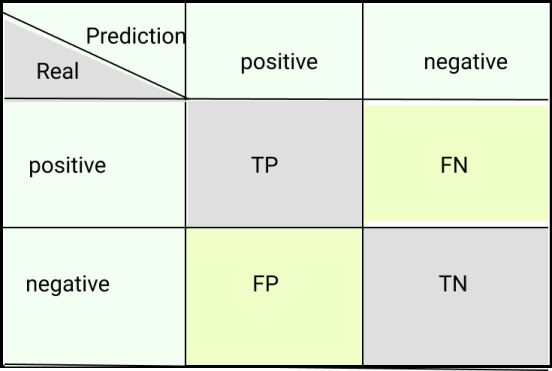

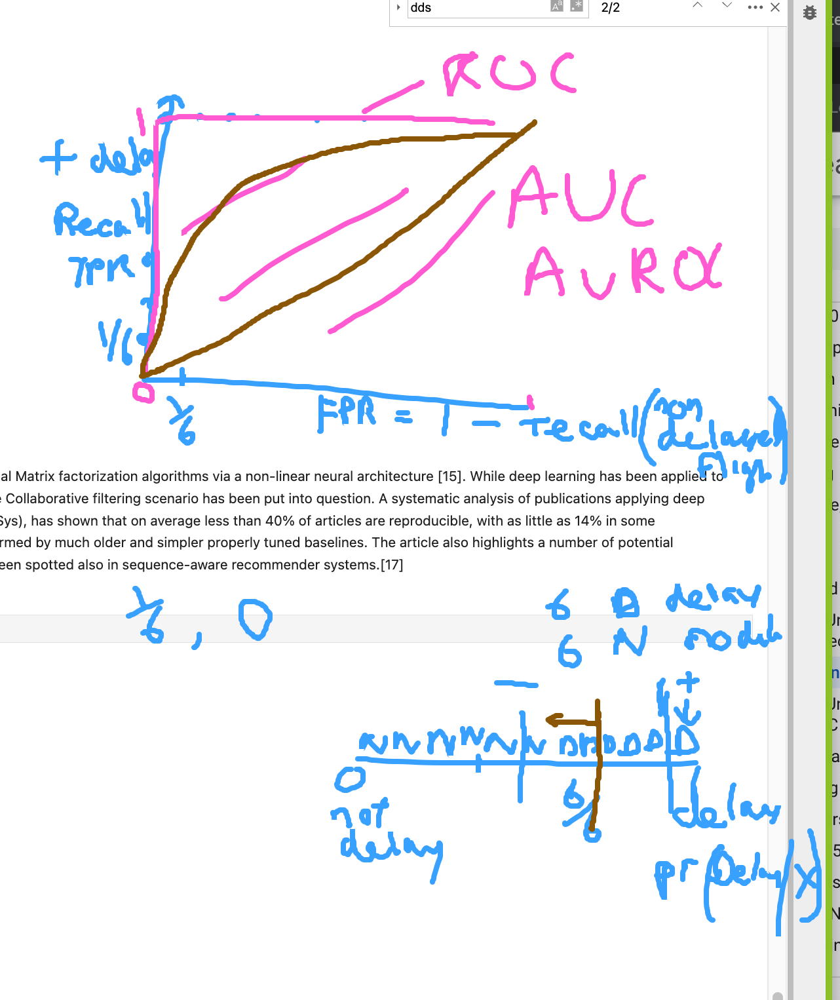

# Deep learning based Recommenders in PySpark with Word2Vec-like embedding
* See Colab notebook: https://colab.research.google.com/drive/1XDwgEecBFc0zo0_2Ln_esheIA9E55fBC?usp=sharing

# Multi-layer Perceptron-based classifiers in PySpark 
* See Colab notebook: https://colab.research.google.com/drive/1XDwgEecBFc0zo0_2Ln_esheIA9E55fBC?usp=sharing

